In [1]:
import numpy as np
import pandas as pd
from sklearn.cluster import DBSCAN
from scipy.stats import pearsonr
import roicat
from roicat.tracking.alignment import Aligner
import os
from pathlib import Path
import multiprocessing as mp
import tempfile
import matplotlib.pyplot as plt

In [2]:
# Main folder for the animal
mousename = 'MZ_CA1_WD_JB_54'
sourcedir = r'Z:\2p\experiment1'

In [4]:
# ----------------------
# STEP 1: Load Suite2p Data Using ROICAT Loader
# ----------------------

# 1) make folder paths containing the stat.npy files and ops.npy files
dir_allOuterFolders = os.path.join(sourcedir,mousename)

pathSuffixToStat = 'stat.npy' # cell's spatial info, shape etc
pathSuffixToOps = 'ops.npy' # program loading/running setting file 
 
paths_all_stat = roicat.helpers.find_paths(
    dir_outer=dir_allOuterFolders,
    reMatch=pathSuffixToStat,
    depth=10,
)[:]
paths_all_ops  = [str(Path(path).resolve().parent / pathSuffixToOps) for path in paths_all_stat]

# print(f'paths to all stat files:')
# [print(path) for path in paths_all_stat]
# print('')
# print(f'paths to all ops files:')
# [print(path) for path in paths_all_ops]

paths to all stat files:
Z:\2p\experiment1\MZ_CA1_WD_JB_54\d1\suite2p\plane0\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_JB_54\d2\suite2p\plane0\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_JB_54\d3\suite2p\plane0\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_JB_54\d4\suite2p\plane0\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_JB_54\d5\suite2p\plane0\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_JB_54\d7\suite2p\plane0\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_JB_54\d8\suite2p\plane0\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_JB_54\d9\suite2p\plane0\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_JB_54\d11\suite2p\plane0\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_JB_54\suite2p\plane0\stat.npy

paths to all ops files:
\\10.52.18.221\Mingkang\2p\experiment1\MZ_CA1_WD_JB_54\d1\suite2p\plane0\ops.npy
\\10.52.18.221\Mingkang\2p\experiment1\MZ_CA1_WD_JB_54\d2\suite2p\plane0\ops.npy
\\10.52.18.221\Mingkang\2p\experiment1\MZ_CA1_WD_JB_54\d3\suite2p\plane0\ops.npy
\\10.52.18.221\Mingkang\2p\experiment1\MZ_CA1_WD_JB_54\d4\suite2p\plane0\ops.npy
\\10.52.18.221\Min

[None, None, None, None, None, None, None, None, None, None]

In [6]:
# 2) Load the specific plane we want to align 
plane = 'plane0'
days = list(range(1,9))
paths_stat = [x for x in paths_all_stat if np.logical_and(plane in x, any(['d'+str(d)+'\\' in x for d in days]))]
paths_ops = [x for x in paths_all_ops if np.logical_and(plane in x, any(['d'+str(d)+'\\' in x for d in days]))]


print(f'paths to all stat files at '+plane+':')
[print(path) for path in paths_stat]
print('')
print(f'paths to all ops files at '+plane+':')
[print(path) for path in paths_ops]

paths to all stat files at plane0:
Z:\2p\experiment1\MZ_CA1_WD_JB_54\d1\suite2p\plane0\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_JB_54\d2\suite2p\plane0\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_JB_54\d3\suite2p\plane0\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_JB_54\d4\suite2p\plane0\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_JB_54\d5\suite2p\plane0\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_JB_54\d7\suite2p\plane0\stat.npy
Z:\2p\experiment1\MZ_CA1_WD_JB_54\d8\suite2p\plane0\stat.npy

paths to all ops files at plane0:
\\10.52.18.221\Mingkang\2p\experiment1\MZ_CA1_WD_JB_54\d1\suite2p\plane0\ops.npy
\\10.52.18.221\Mingkang\2p\experiment1\MZ_CA1_WD_JB_54\d2\suite2p\plane0\ops.npy
\\10.52.18.221\Mingkang\2p\experiment1\MZ_CA1_WD_JB_54\d3\suite2p\plane0\ops.npy
\\10.52.18.221\Mingkang\2p\experiment1\MZ_CA1_WD_JB_54\d4\suite2p\plane0\ops.npy
\\10.52.18.221\Mingkang\2p\experiment1\MZ_CA1_WD_JB_54\d5\suite2p\plane0\ops.npy
\\10.52.18.221\Mingkang\2p\experiment1\MZ_CA1_WD_JB_54\d7\suite2p\plane0\ops.npy
\\10.52.18.221\Mi

[None, None, None, None, None, None, None]

In [61]:
# 3) Load data with roicat suite2p data loader
data = roicat.data_importing.Data_suite2p(
    paths_statFiles=paths_stat[:],
    paths_opsFiles=paths_ops[:],
    um_per_pixel=3.0,  ## IMPORTANT PARAMETER. Use a list of floats if values differ in each session.
    new_or_old_suite2p='new',
    type_meanImg='meanImgE', # raw mean image across all registered frames
    verbose=True,
)

assert data.check_completeness(verbose=False)['tracking'], f"Data object is missing attributes necessary for tracking."

c:\Users\mzhou9\Anaconda3\envs\roicat\Lib\site-packages\roicat\util.py:415: UserWarning: RH WARNING: unable to get gcc version. Got error: [WinError 2] The system cannot find the file specified
  warnings.warn(f'RH WARNING: unable to get gcc version. Got error: {e}')


Starting: Importing FOV images from ops files
Completed: Set FOV_height and FOV_width successfully.
Completed: Imported 7 FOV images.
Setting FOV_images...
Completed: Set FOV_images for 7 sessions successfully.
Importing spatial footprints from stat files.


  0%|          | 0/7 [00:00<?, ?it/s]

Imported 7 sessions of spatial footprints into sparse arrays.
Completed: Set spatialFootprints for 7 sessions successfully.
Completed: Created session_bool.
Completed: Created centroids.
Starting: Creating centered ROI images from spatial footprints...
Completed: Created ROI images.


In [42]:
### Optional things in between

# Subselecting ROIs that are only cells, not suggested intially but can do 
# data.remove_rois_by_classLabel(classLabel_to_keep=1, verbose=True)

# Visualizing FOV images
# roicat.visualization.display_toggle_image_stack(data.FOV_images)
# roicat.visualization.display_toggle_image_stack(data.get_maxIntensityProjection_spatialFootprints(), clim=[0,1])
# roicat.visualization.display_toggle_image_stack(np.concatenate(data.ROI_images, axis=0)[:5000], image_size=(200,200))

DEVICE = roicat.helpers.set_device(use_GPU=True)
SEED = roicat.util.set_random_seed(seed=None, deterministic=False)  ## Deterministic algorithms have issues, but are useful for debugging, testing, and reproducing results.

Using device: cpu


In [62]:
# ----------------------
# STEP 2: Align images across sessions and correct them
# ----------------------

# 1) load the aligner 
aligner = roicat.tracking.alignment.Aligner(
    use_match_search=True,  ## Use our algorithm for doing all-pairs matching if template matching fails.
    all_to_all=False,  ## Force the use of our algorithm for all-pairs matching. Much slower (False: O(N) vs. True: O(N^2)), but more accurate.
    radius_in=4,  ## IMPORTANT PARAMETER: Value in micrometers used to define the maximum shift/offset between two images that are considered to be aligned. Larger means more lenient alignment.
    radius_out=20,  ## Value in micrometers used to define the minimum shift/offset between two images that are considered to be misaligned.
    z_threshold=4,  ## IMPORTANT PARAMETER: Z-score required to define two images as aligned. Larger values results in more stringent alignment requirements.
    um_per_pixel=data.um_per_pixel[0],  ## Single value for um_per_pixel. data.um_per_pixel is typically a list of floats, so index out just one value.
    device=DEVICE,
    verbose=True,
)


c:\Users\mzhou9\Anaconda3\envs\roicat\Lib\site-packages\roicat\util.py:415: UserWarning: RH WARNING: unable to get gcc version. Got error: [WinError 2] The system cannot find the file specified
  warnings.warn(f'RH WARNING: unable to get gcc version. Got error: {e}')


In [84]:
# 2) Load the augment function to visually enhance the FOV images for alignment 
FOV_images = aligner.augment_FOV_images(
    FOV_images=data.FOV_images, # mean FOV image for each session
    spatialFootprints=data.spatialFootprints,
    normalize_FOV_intensities=True,
    roi_FOV_mixing_factor=0.5, # how much weight the ROI foorprint images has in final image (usually 0.5)
    use_CLAHE=True,  ## IMPORTANT PARAMETER. Use Set to False if data is poor quality or poorly aligned.
    CLAHE_grid_block_size=8,  ## IMPORTANT PARAMETER. Use smaller values for higher precision but higher chance of failure.
    CLAHE_clipLimit=1.0,
    CLAHE_normalize=True,
)


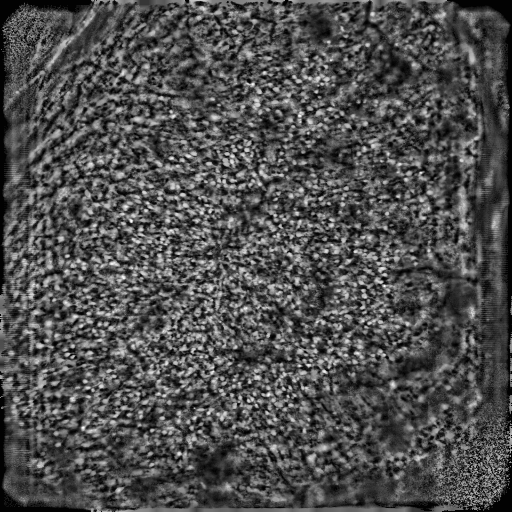

In [85]:
# Visual display of the pre-alignment FOV images
roicat.visualization.display_toggle_image_stack(FOV_images)

In [107]:
# 3) Align the FOVs based on geometric transformation
aligner.fit_geometric(
    template=0.5,  ## specifies which image to use as the template. Either array (image), integer (ims_moving index), or float (ims_moving fractional index)
    ims_moving=FOV_images,  ## input images
    template_method='sequential',  ## 'sequential': align images to neighboring images (good for drifting data). 'image': align to a single image
    mask_borders=(0, 0, 0, 0),  ## number of pixels to mask off the edges (top, bottom, left, right)
    method='DISK_LightGlue',  ## See below for options.
    kwargs_method = {
        'RoMa': {  ## Accuracy: Best, Speed: Very slow (can be fast with a GPU).
            'model_type': 'outdoor',
            'n_points': 10000,  ## Higher values mean more points are used for the registration. Useful for larger FOV_images. Larger means slower.
            'batch_size': 1000,
        },
        'DISK_LightGlue': {  ## Accuracy: Good, Speed: Fast.
            'num_features': 3000,  ## Number of features to extract and match. I've seen best results around 2048 despite higher values typically being better.
            'threshold_confidence': 0.0,  ## Higher values means fewer but better matches.
            'window_nms': 7,  ## Non-maximum suppression window size. Larger values mean fewer non-suppressed points.
        },
        'LoFTR': {  ## Accuracy: Okay. Speed: Medium.
            'model_type': 'indoor_new',
            'threshold_confidence': 0.2,  ## Higher values means fewer but better matches.
        },
        'ECC_cv2': {  ## Accuracy: Okay. Speed: Medium.
            'mode_transform': 'euclidean',  ## Must be one of {'translation', 'affine', 'euclidean', 'homography'}. See cv2 documentation on findTransformECC for more details.
            'n_iter': 200,
            'termination_eps': 1e-09,  ## Termination criteria for the registration algorithm. See documentation for more details.
            'gaussFiltSize': 1,  ## Size of the gaussian filter used to smooth the FOV_image before registration. Larger values mean more smoothing.
            'auto_fix_gaussFilt_step': 10,  ## If the registration fails, then the gaussian filter size is reduced by this amount and the registration is tried again.
        },
        'PhaseCorrelation': {  ## Accuracy: Poor. Speed: Very fast. Notes: Only applicable for translations, not rotations or scaling.
            'bandpass_freqs': [1, 30],
            'order': 5,
        },
    },
    kwargs_RANSAC = {
        'inl_thresh': 3.0,  ## cv2.findHomography RANSAC inlier threshold. Larger values mean more lenient matching.
        'max_iter': 100,
        'confidence': 0.99,
    },
    verbose=True,  ## Set to 3 to view plots of the alignment process if available for the method.
)

Loaded LightGlue model
Converting float fractional index to integer index: 0.5 -> 3


Finding geometric registration warps:   0%|          | 0/7 [00:00<?, ?it/s]

Alignment z_in scores: [85.2, 97.7, 143.6, 11041136640.0, 114.9, 94.2, 122.3]. z_threshold: 4.
All images aligned successfully!


[array([[[-1.18360023e+00, -9.83380278e+00],
         [-1.75821292e-01, -9.81192053e+00],
         [ 8.31927506e-01, -9.79003895e+00],
         ...,
         [ 5.07908072e+02,  1.22027490e+00],
         [ 5.08900681e+02,  1.24182775e+00],
         [ 5.09893261e+02,  1.26337997e+00]],
 
        [[-1.19913433e+00, -8.82254625e+00],
         [-1.91363911e-01, -8.80067932e+00],
         [ 8.16376363e-01, -8.77881305e+00],
         ...,
         [ 5.07888265e+02,  2.22379609e+00],
         [ 5.08880866e+02,  2.24533386e+00],
         [ 5.09873437e+02,  2.26687099e+00]],
 
        [[-1.21466815e+00, -7.81130730e+00],
         [-2.06906259e-01, -7.78945569e+00],
         [ 8.00825491e-01, -7.76760473e+00],
         ...,
         [ 5.07868458e+02,  3.22729997e+00],
         [ 5.08861050e+02,  3.24882266e+00],
         [ 5.09853613e+02,  3.27034471e+00]],
 
        ...,
 
        [[-9.05570216e+00,  5.02633478e+02],
         [-8.05224395e+00,  5.02647634e+02],
         [-7.04881562e+00,  5.0266


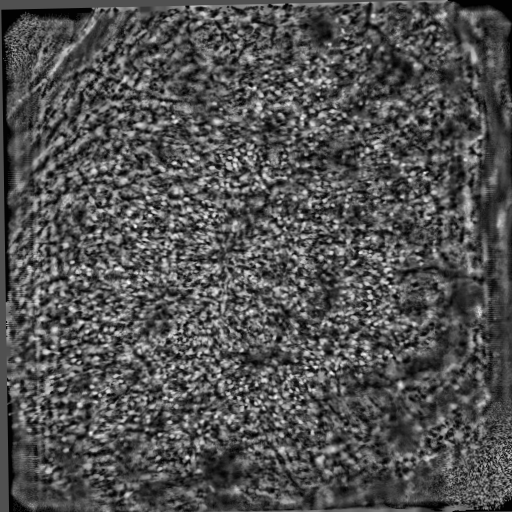

In [108]:
roicat.visualization.display_toggle_image_stack(aligner.ims_registered_geo)

(<Figure size 600x300 with 3 Axes>, None)

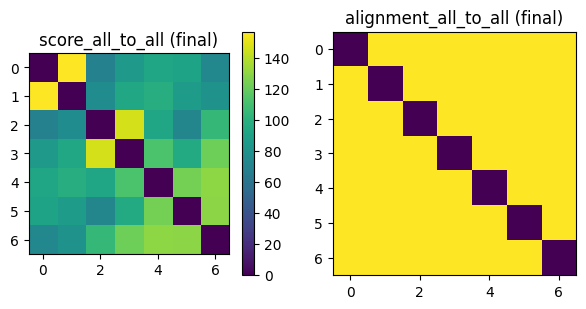

In [95]:
aligner.plot_alignment_results_geometric()

In [112]:
# 4) Non-rigid transformation 
aligner.fit_nonrigid(
    template=0.5,  ## specifies which image to use as the template. Either array (image), integer (ims_moving index), or float (ims_moving fractional index)
    ims_moving=aligner.ims_registered_geo,  ## Input images. Typically the geometrically registered images
    remappingIdx_init=aligner.remappingIdx_geo,  ## The remappingIdx between the original images (and ROIs) and ims_moving
    template_method='image',  ## 'sequential': align images to neighboring images. 'image': align to a single image, good if using geometric registration first
    method='DeepFlow',
    kwargs_method = {
        'DeepFlow': {},  ## Accuracy: Good (good in middle, poor on edges), Speed: Fast (CPU only)
        'RoMa': {  ## Accuracy: Okay (decent in middle, poor on edges), Speed: Slow (can be fast with a GPU), Notes: This method can work on the raw images without pre-registering using geometric methods.
            'model_type': 'outdoor',
        },
        'OpticalFlowFarneback': {  ## Accuracy: Varies (can sometimes be tuned to be the best as there are no edge artifacts), Speed: Medium (CPU only)
            'pyr_scale': 0.7,
            'levels': 5,
            'winsize': 256,
            'iterations': 15,
            'poly_n': 5,
            'poly_sigma': 1.5,            
        },
    },    
)

aligner.transform_images_nonrigid(FOV_images)

Converting float fractional index to integer index: 0.5 -> 3
Finding nonrigid registration warps with mode: DeepFlow, template_method: image


Finding nonrigid registration warps:   0%|          | 0/7 [00:00<?, ?image/s]

Composing nonrigid warp matrices...
Applying nonrigid registration warps to images...


[array([[0.00660804, 0.00660804, 0.00660804, ..., 0.18782154, 0.18782154,
         0.18782154],
        [0.00660804, 0.00660804, 0.00660804, ..., 0.00660804, 0.18782154,
         0.18782154],
        [0.00660804, 0.00660804, 0.00660804, ..., 0.00660804, 0.18782154,
         0.18782154],
        ...,
        [0.18782154, 0.00660804, 0.00660804, ..., 0.18782154, 0.18782154,
         0.18782154],
        [0.18782154, 0.00660804, 0.00660804, ..., 0.18782154, 0.18782154,
         0.18782154],
        [0.18782154, 0.00660804, 0.00660804, ..., 0.18782154, 0.18782154,
         0.18782154]], dtype=float32),
 array([[0.00660804, 0.00660804, 0.00660804, ..., 0.18598774, 0.18598774,
         0.18598774],
        [0.00660804, 0.00660804, 0.00660804, ..., 0.18598774, 0.18598774,
         0.18598774],
        [0.00660804, 0.00660804, 0.00660804, ..., 0.18598774, 0.18598774,
         0.18598774],
        ...,
        [0.18598774, 0.18598774, 0.18598774, ..., 0.18598774, 0.18598774,
         0.18598774

(<Figure size 600x300 with 3 Axes>, None)

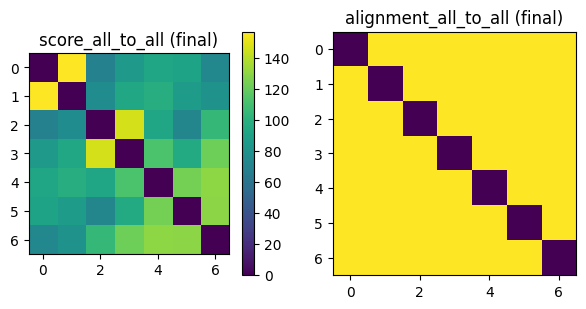

In [113]:
aligner.plot_alignment_results_nonrigid()


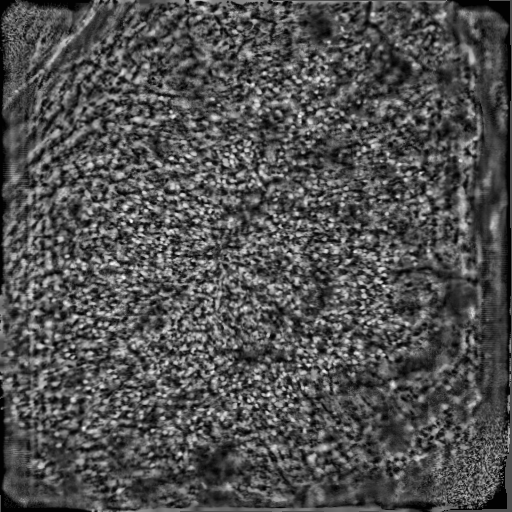

In [114]:
roicat.visualization.display_toggle_image_stack(aligner.ims_registered_nonrigid)

In [119]:
# 5) Apply the non-rigid spatial transformation to the ROI footprints to align them across sessions in a common space
aligner.transform_ROIs(
    ROIs=data.spatialFootprints, 
    remappingIdx=aligner.remappingIdx_nonrigid,
    # remappingIdx=aligner.remappingIdx_geo,
    normalize=True,
)

Registering ROIs...


Registering ROIs:   0%|          | 0/7 [00:00<?, ?it/s]

[<Compressed Sparse Row sparse matrix of dtype 'float32'
 	with 225975 stored elements and shape (1280, 262144)>,
 <Compressed Sparse Row sparse matrix of dtype 'float32'
 	with 248317 stored elements and shape (1276, 262144)>,
 <Compressed Sparse Row sparse matrix of dtype 'float32'
 	with 113660 stored elements and shape (1303, 262144)>,
 <Compressed Sparse Row sparse matrix of dtype 'float32'
 	with 231272 stored elements and shape (1299, 262144)>,
 <Compressed Sparse Row sparse matrix of dtype 'float32'
 	with 113331 stored elements and shape (1162, 262144)>,
 <Compressed Sparse Row sparse matrix of dtype 'float32'
 	with 235498 stored elements and shape (1522, 262144)>,
 <Compressed Sparse Row sparse matrix of dtype 'float32'
 	with 85400 stored elements and shape (1140, 262144)>]


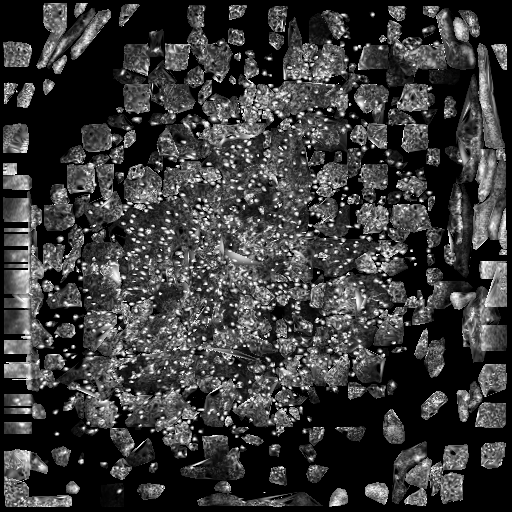

In [120]:
roicat.visualization.display_toggle_image_stack(aligner.get_ROIsAligned_maxIntensityProjection(normalize=True), clim=None)

In [117]:
# 6) Blurring ROI edges to increase the overlap between ROIs that drift apart across sessions. 
# Can increase the kernel_halfWidth if working with sparsely labeled ROIs or ROIs that change or move across sessions.
blurrer = roicat.tracking.blurring.ROI_Blurrer(
    frame_shape=(data.FOV_height, data.FOV_width),  ## FOV height and width
    kernel_halfWidth=4,  ## The half width of the 2D gaussian used to blur the ROI masks
    plot_kernel=False,  ## Whether to visualize the 2D gaussian
)

blurrer.blur_ROIs(
    spatialFootprints=aligner.ROIs_aligned[:],
)

Preparing the Toeplitz convolution matrix
Performing convolution for blurring


[<Compressed Sparse Column sparse matrix of dtype 'float32'
 	with 452743 stored elements and shape (1280, 262144)>,
 <Compressed Sparse Column sparse matrix of dtype 'float32'
 	with 485984 stored elements and shape (1276, 262144)>,
 <Compressed Sparse Column sparse matrix of dtype 'float32'
 	with 296671 stored elements and shape (1303, 262144)>,
 <Compressed Sparse Column sparse matrix of dtype 'float32'
 	with 454070 stored elements and shape (1299, 262144)>,
 <Compressed Sparse Column sparse matrix of dtype 'float32'
 	with 285751 stored elements and shape (1162, 262144)>,
 <Compressed Sparse Column sparse matrix of dtype 'float32'
 	with 500694 stored elements and shape (1522, 262144)>,
 <Compressed Sparse Column sparse matrix of dtype 'float32'
 	with 245674 stored elements and shape (1140, 262144)>]


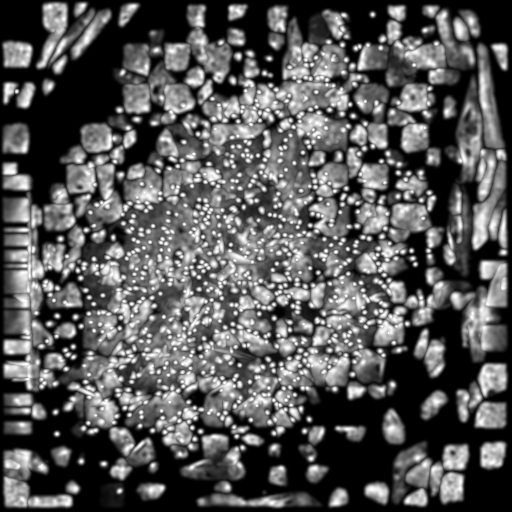

In [121]:
roicat.visualization.display_toggle_image_stack(blurrer.get_ROIsBlurred_maxIntensityProjection())

In [124]:
# ----------------------
# STEP 3: Compute similarities between ROIs
# ----------------------


# 1) Pass through ROI through ROInet neural nework. This is a pretrained neural network used to compute embeddings 
# (feature vectors) for each ROI. These embeddings capture shape, texture, and structure in an abstract, high dimensional
# space. This learned morphology will be used for clustering later.

dir_temp = tempfile.gettempdir()

roinet = roicat.ROInet.ROInet_embedder(
    device=DEVICE,  ## Which torch device to use ('cpu', 'cuda', etc.)
    dir_networkFiles=dir_temp,  ## Directory to download the pretrained network to
    download_method='check_local_first',  ## Check to see if a model has already been downloaded to the location (will skip if hash matches)
    download_url='https://osf.io/x3fd2/download',  ## URL of the model
    download_hash='7a5fb8ad94b110037785a46b9463ea94',  ## Hash of the model file
    forward_pass_version='latent',  ## How the data is passed through the network
    verbose=True,  ## Whether to print updates
)

c:\Users\mzhou9\Anaconda3\envs\roicat\Lib\site-packages\roicat\util.py:415: UserWarning: RH WARNING: unable to get gcc version. Got error: [WinError 2] The system cannot find the file specified
  warnings.warn(f'RH WARNING: unable to get gcc version. Got error: {e}')


File does not exist locally: C:\Users\mzhou9\AppData\Local\Temp\1\ROInet.zip. Will attempt download from https://osf.io/x3fd2/download


  0%|          | 0.00/48.9M [00:00<?, ?B/s]

Hash of downloaded file matches hash_hex.
Extracting C:\Users\mzhou9\AppData\Local\Temp\1\ROInet.zip to C:\Users\mzhou9\AppData\Local\Temp\1.
Completed zip extraction.
Imported model from C:\Users\mzhou9\AppData\Local\Temp\1\ROInet_tracking_20220527\model.py
Loaded params_model from C:\Users\mzhou9\AppData\Local\Temp\1\ROInet_tracking_20220527\params.json


c:\Users\mzhou9\Anaconda3\envs\roicat\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\mzhou9\Anaconda3\envs\roicat\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You can also use `weights=ConvNeXt_Tiny_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Generated network using params_model
Loaded state_dict into network from C:\Users\mzhou9\AppData\Local\Temp\1\ROInet_tracking_20220527\ConvNext_tiny__1_0_best__simCLR.pth
Loaded network onto device cpu


In [131]:
# 2) Resize ROIs and prepare a dataloader
roinet.generate_dataloader(
    ROI_images=data.ROI_images,  ## Input images of ROIs
    um_per_pixel=data.um_per_pixel,  ## Resolution of FOV
    pref_plot=False,  ## Whether or not to plot the ROI sizes
    
    jit_script_transforms=False,  ## (advanced) Whether or not to use torch.jit.script to speed things up
    
    batchSize_dataloader=8,  ## (advanced) PyTorch dataloader batch_size
    pinMemory_dataloader=True,  ## (advanced) PyTorch dataloader pin_memory
    numWorkers_dataloader=mp.cpu_count(),  ## (advanced) PyTorch dataloader num_workers
    persistentWorkers_dataloader=True,  ## (advanced) PyTorch dataloader persistent_workers
    prefetchFactor_dataloader=2,  ## (advanced) PyTorch dataloader prefetch_factor
)

Starting Image Resizer
Creating dataloader
Defined image transformations: Sequential(
  (0): ScaleDynamicRange(scaler_bounds=(0, 1))
  (1): Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
  (2): TileChannels(dim=0)
)
Defined dataset
Defined dataloader


array([[[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        ...,
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         5.16951364e-03, 4.32701036e-03, 3.87105206e-03],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         4.05926863e-03, 3.41578247e-03, 3.28239216e-03],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         3.10829445e-03, 2.28505721e-03, 2.18286365e-03]],

       [[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
        [0.00000000e+00, 


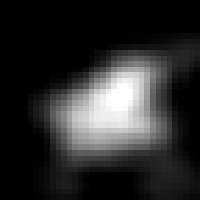

In [132]:
roicat.visualization.display_toggle_image_stack(roinet.ROI_images_rs[:1000], image_size=(200,200))

In [138]:
# 3) Pass through data through the network to store these deep feature embeddings for each ROI

roinet.generate_latents()

starting: running data through network


  0%|          | 0/1123 [00:00<?, ?it/s]

completed: running data through network


tensor([[ 1.1431e+05,  2.1717e+04, -4.7646e+03,  ..., -3.0038e+04,
          3.3558e+04, -1.8987e+04],
        [ 1.3624e+05, -2.6426e+04, -1.2009e+04,  ..., -2.7028e+04,
          1.8531e+04, -1.2639e+04],
        [ 9.3821e+04,  7.8733e+01,  8.1693e+04,  ...,  3.6403e+04,
          1.9147e+01,  2.5827e+04],
        ...,
        [ 3.5828e+04,  4.2335e+04, -2.8732e+04,  ...,  1.1261e+04,
          2.1559e+04,  2.0064e+04],
        [ 1.1189e+05,  5.1187e+04,  3.6436e+04,  ..., -6.8895e+03,
          2.4639e+04, -1.1912e+04],
        [ 7.9835e+04, -8.2323e+03,  2.8903e+03,  ...,  3.5746e+04,
          5.2458e+04, -3.2176e+04]])

In [136]:
# 4) Apply scattering wavelet embedding - deep feature extractor that captures fine-scale image structures like orientation,
# edges and local frequency content. Similar idea as ROInet. 

swt = roicat.tracking.scatteringWaveletTransformer.SWT(
    kwargs_Scattering2D={'J': 2, 'L': 12},  ## 'J' is the number of convolutional layers. 'L' is the number of wavelet angles.
    image_shape=data.ROI_images[0].shape[1:3],  ## size of a cropped ROI image
    device=DEVICE,  ## PyTorch device
)

swt.transform(
    ROI_images=roinet.ROI_images_rs,  ## All the cropped and resized ROI images
    batch_size=100,  ## Batch size for each iteration (smaller is less memory but slower)
)

c:\Users\mzhou9\Anaconda3\envs\roicat\Lib\site-packages\roicat\util.py:415: UserWarning: RH WARNING: unable to get gcc version. Got error: [WinError 2] The system cannot find the file specified
  warnings.warn(f'RH WARNING: unable to get gcc version. Got error: {e}')


SWT initialized
Starting: SWT transform on ROIs


  0%|          | 0/89.82 [00:00<?, ?it/s]

Completed: SWT transform on ROIs


tensor([[ 3.3689e-08,  5.1228e-07,  6.4744e-06,  ...,  2.9365e-05,
          3.8280e-05,  2.0713e-05],
        [ 4.3252e-09,  1.3692e-06,  5.9094e-06,  ...,  3.4096e-05,
          3.2709e-05,  1.6683e-05],
        [ 9.0495e-03,  7.1575e-03,  4.2098e-03,  ...,  1.2882e-05,
          2.8148e-05,  3.8987e-05],
        ...,
        [ 9.4251e-07,  1.2719e-05,  1.1749e-04,  ...,  4.3571e-05,
          4.8041e-05,  1.9804e-05],
        [ 2.1446e-04,  2.1380e-04,  3.9620e-05,  ...,  6.1273e-05,
          4.2065e-05,  2.5493e-05],
        [ 2.4241e-08, -2.1434e-09,  2.9635e-08,  ...,  5.0728e-05,
          2.1679e-05,  1.4538e-05]])

c:\Users\mzhou9\Anaconda3\envs\roicat\Lib\site-packages\roicat\util.py:415: UserWarning: RH WARNING: unable to get gcc version. Got error: [WinError 2] The system cannot find the file specified
  warnings.warn(f'RH WARNING: unable to get gcc version. Got error: {e}')


Computing pairwise similarity between ROIs...


  0%|          | 0/16 [00:00<?, ?it/s]

Joining blocks into full similarity matrices...
Joining s_sf...
Joining s_NN...
Joining s_SWT...
Joining s_sesh...


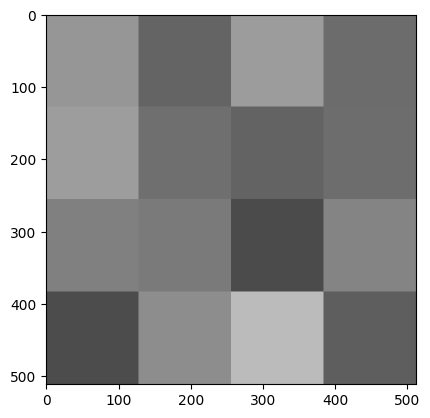

In [141]:
# 5) Compute similarities of ROIs including
# 1. `s_sf`: 'similarity spatial footprint'. The physical overlap between ROIs.
# 2. `s_NN`: 'similarity neural network'. The similarities of the embeddings out of ROInet.
# 3. `s_SWT`: 'similarity scaterring wavelet transform'. The similarities of the embeddings out of the scattering wavelet transformer.
# 4. `s_sesh`: 'similarity sessions'. 0 if from the same session, 1 if from different sessions. ROIs from the same session have 0 probability of being the same.

sim = roicat.tracking.similarity_graph.ROI_graph(
    n_workers=-1,  ## Number of CPU cores to use. -1 for all.
    frame_height=data.FOV_height,
    frame_width=data.FOV_width,
    block_height=128,  ## size of a block
    block_width=128,  ## size of a block
    algorithm_nearestNeigbors_spatialFootprints='brute',  ## algorithm used to find the pairwise similarity for s_sf. ('brute' is slow but exact. See docs for others.)
    verbose=True,  ## Whether to print outputs
)

sim.visualize_blocks()

s_sf, s_NN, s_SWT, s_sesh = sim.compute_similarity_blockwise(
    spatialFootprints=blurrer.ROIs_blurred,  ## Mask spatial footprints
    features_NN=roinet.latents,  ## ROInet output latents
    features_SWT=swt.latents,  ## Scattering wavelet transform output latents
    ROI_session_bool=data.session_bool,  ## Boolean array of which ROIs belong to which sessions
    spatialFootprint_maskPower=1.0,  ##  An exponent to raise the spatial footprints to to care more or less about bright pixels
)

In [142]:
# 6) Normalize the similarity matrix using local ROIs
sim.make_normalized_similarities(
    centers_of_mass=data.centroids,  ## ROI centroid positions
    features_NN=roinet.latents,  ## ROInet latents
    features_SWT=swt.latents,  ## SWT latents
    k_max=data.n_sessions*100,  ## Maximum number of nearest neighbors to consider for the normalizing distribution
    k_min=data.n_sessions*10,  ## Minimum number of nearest neighbors to consider for the normalizing distribution
    algo_NN='kd_tree',  ## Nearest neighbors algorithm to use
    device=DEVICE,
)

Finding k-range of center of mass distance neighbors for each ROI...
Normalizing Neural Network similarity scores...


  0%|          | 0/8982 [00:00<?, ?it/s]

Normalizing SWT similarity scores...


  0%|          | 0/8982 [00:00<?, ?it/s]

c:\Users\mzhou9\Anaconda3\envs\roicat\Lib\site-packages\roicat\tracking\similarity_graph.py:466: RuntimeWarning: invalid value encountered in divide
  self.s_SWT_z.data = ((self.s_SWT_z.data - mus_SWT_diff[self.s_SWT_z.row]) / stds_SWT_diff[self.s_SWT_z.row])


In [145]:
# ----------------------
# STEP 4: Clustering
# ----------------------

# 1) Combine the similarity matrices into a single distance matrix 
# This step finds the optimal parameters to mix the similarity matrices by tuning mixing parameters to maximally 
# separate the distributions of pairwise similarities for ROI pairs known to be different and ROI pairs that are likely matched.

# Some of the details of underlying algorithm:
# 1. For each step in the optimization process, all the similarity matrices (`s_sf`, `s_NN_z`, `s_SWT_z`, `s_sesh`) 
# are each passed through a sigmoid activation function that is parameterized (e.g. `'power_SF'`, `'sig_SF_kwargs'`), then all the similarity matrices are combined using a p-norm, where the 'p' is parameterized with `'p_norm'`. 
# This results in a single conjunctive similarity matrix called `sConj` bounded between 0-1. 
# This allows each matrix to emphasize midrange scores and suppress noise in low-similarity mataches.
# 2. `sConj` is converted into a distance matrix `dConj` (bounded from 1-0).
# 3. `dConj` is then passed through the objective function: The full distance matrix is separated into a few components. 
# First, all pairs of ROIs that are known to be from 'different' sources because they are from the same session are separated out into a distribution of pairwise distances (`d_diff`). Second, we define pairs of ROIs that are likely to be from the same source as `d_same` = `d_all` - `d_diff`. The objective function is then the overlap between the `d_diff` and `d_same` distributions. 
# 4. The objective function is minimized by tuning the mixing parameters in `kwargs_makeConjunctiveDistanceMatrix`.
# 5. The output of this step is the optimal `kwargs_makeConjunctiveDistanceMatrix` dictionary.

## Initialize the clusterer object by passing the similarity matrices in
clusterer = roicat.tracking.clustering.Clusterer(
    s_sf=sim.s_sf,
    s_NN_z=sim.s_NN_z,
    s_SWT_z=sim.s_SWT_z,
    s_sesh=sim.s_sesh,
    verbose=1,
)

# Uncomment below to automatically find mixing parameters
kwargs_makeConjunctiveDistanceMatrix_best = clusterer.find_optimal_parameters_for_pruning(
    n_bins=None,  ## Number of bins to use for the histograms of the distributions. If None, then a heuristic is used.
    smoothing_window_bins=None,  ## Number of bins to use to smooth the distributions. If None, then a heuristic is used.
    kwargs_findParameters={
        'n_patience': 300,  ## Number of optimization epoch to wait for tol_frac to converge
        'tol_frac': 0.001,  ## Fractional change below which optimization will conclude
        'max_trials': 1200,  ## Max number of optimization epochs
        'max_duration': 60*10,  ## Max amount of time (in seconds) to allow optimization to proceed for
        'value_stop': 0.0,  ## Goal value. If value equals or goes below value_stop, optimization is stopped.
    },
    bounds_findParameters={
        'power_NN': [0.0, 2.],  ## Bounds for the exponent applied to s_NN
        'power_SWT': [0.0, 2.],  ## Bounds for the exponent applied to s_SWT
        'p_norm': [-5, -0.1],  ## Bounds for the p-norm p value (Minkowski) applied to mix the matrices
        'sig_NN_kwargs_mu': [0., 1.0],  ## Bounds for the sigmoid center for s_NN
        'sig_NN_kwargs_b': [0.1, 1.5],  ## Bounds for the sigmoid slope for s_NN
        'sig_SWT_kwargs_mu': [0., 1.0],  ## Bounds for the sigmoid center for s_SWT
        'sig_SWT_kwargs_b': [0.1, 1.5],  ## Bounds for the sigmoid slope for s_SWT
    },
    n_jobs_findParameters=-1,  ## Number of CPU cores to use (-1 is all cores)
    seed=SEED,  ## Random seed
)

Finding mixing parameters using automated hyperparameter tuning...


  0%|          | 0/1200 [00:00<?, ?it/s]

Best value found: 12388920.0 with parameters {'power_NN': 1.9668303632861324, 'power_SWT': 1.7917746677435866, 'p_norm': -0.10172994169480741, 'sig_NN_kwargs': {'mu': 0.8429544558953196, 'b': 1.4946580347283671}, 'sig_SWT_kwargs': {'mu': 0.09146237763340004, 'b': 1.4741284025527077}}


In [146]:
# 2) Prune the distance matrix
# We can remove all connections in the distance graph with probabilities of connection of less than 50%. We estimate this cutoff distance as the cross-over point between the 'same' and 'different' distributions.

# **Important parameter**\
# `stringency`: This value changes the threshold for pruning the distance matrix. A higher value will result in less pruning, and a lower value will result in more pruning. 
# The value will be multiplied by the inferred threshold to get the new one.

clusterer.make_pruned_similarity_graphs(
    d_cutoff=None,  ## Optionally manually specify a distance cutoff
    kwargs_makeConjunctiveDistanceMatrix=kwargs_makeConjunctiveDistanceMatrix_best,
    stringency=1.0,  ## Modifies the threshold for pruning the distance matrix. Higher values result in LESS pruning. New d_cutoff = stringency * truncated d_cutoff.
    convert_to_probability=False,    
)

Pruning similarity graphs with d_cutoff = 0.5510203838348389...


c:\Users\mzhou9\Anaconda3\envs\roicat\Lib\site-packages\scipy\sparse\_index.py:210: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_arrayXarray(i, j, x)


In [147]:
# 3) Clustering

# There are two methods for clustering: The standard method `.fit` which is based on HDBSCAN, and `.fit_sequentialHungarian` 
# which is an algorithm that is also used by CaImAn based on the Hungarian algorithm. 
# The standard method takes 1-20 minutes and works better when there are many sessions, the Hungarian method takes seconds and works better when there are fewer sessions (<8).

# **Important parameters**:
# - For standard **`.fit`** method:
# 1. `min_cluster_size`: If you only want ROIs clusters with at least a certain number of samples, specify here.
# 2. `n_iter_violationCorrection`: This parameter controls how fast this step takes. Turning it down has mild effects on quality. We use around ***6***.

# - For **`.fit_sequentialHungarian`** method:
# 1. `thresh_cost`: Determines the threshold of how distant two ROIs can be and still be matched. Smaller value is more stringent.

if data.n_sessions >= 6:
    labels = clusterer.fit(
        d_conj=clusterer.dConj_pruned,  ## Input distance matrix
        session_bool=data.session_bool,  ## Boolean array of which ROIs belong to which sessions
        min_cluster_size=2,  ## Minimum number of ROIs that can be considered a 'cluster'
        n_iter_violationCorrection=6,  ## Number of times to redo clustering sweep after removing violations
        split_intraSession_clusters=True,  ## Whether or not to split clusters with ROIs from the same session
        cluster_selection_method='leaf',  ## (advanced) Method of cluster selection for HDBSCAN (see hdbscan documentation)
        d_clusterMerge=None,  ## Distance below which all ROIs are merged into a cluster
        alpha=0.999,  ## (advanced) Scalar applied to distance matrix in HDBSCAN (see hdbscan documentation)
        discard_failed_pruning=True,  ## (advanced) Whether or not to set all ROIs that could be separated from clusters with ROIs from the same sessions to label=-1
        n_steps_clusterSplit=100,  ## (advanced) How finely to step through distances to remove violations
    )

else:
    labels = clusterer.fit_sequentialHungarian(
        d_conj=clusterer.dConj_pruned,  ## Input distance matrix
        session_bool=data.session_bool,  ## Boolean array of which ROIs belong to which sessions
        thresh_cost=0.8,  ## Threshold. Higher values result in more permissive clustering. Specifically, the pairwise metric distance between ROIs above which two ROIs cannot be clustered together.
    )

Fitting with HDBSCAN and splitting clusters with multiple ROIs per session


  0%|          | 0/6 [00:00<?, ?it/s]

c:\Users\mzhou9\Anaconda3\envs\roicat\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Initial number of violating clusters: 257


c:\Users\mzhou9\Anaconda3\envs\roicat\Lib\site-packages\scipy\sparse\_index.py:201: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil and dok are more efficient.
  self._set_arrayXarray_sparse(i, j, x)


Initial number of violating clusters: 152
Initial number of violating clusters: 111
Initial number of violating clusters: 94
Initial number of violating clusters: 91
Initial number of violating clusters: 83


In [149]:
quality_metrics = clusterer.compute_quality_metrics()

In [150]:
labels_squeezed, labels_bySession, labels_bool, labels_bool_bySession, labels_dict = roicat.tracking.clustering.make_label_variants(labels=labels, n_roi_bySession=data.n_roi)

results_clusters = {
    'labels': labels_squeezed,
    'labels_bySession': labels_bySession,
    'labels_dict': labels_dict,
    'quality_metrics': quality_metrics,
}

results_all = {
    "clusters":{
        "labels": roicat.util.JSON_List(labels_squeezed),
        "labels_bySession": roicat.util.JSON_List(labels_bySession),
        "labels_bool": labels_bool,
        "labels_bool_bySession": labels_bool_bySession,
        "labels_dict": roicat.util.JSON_Dict(labels_dict),
        "quality_metrics": roicat.util.JSON_Dict(clusterer.quality_metrics) if hasattr(clusterer, 'quality_metrics') else None,
    },
    "ROIs": {
        "ROIs_aligned": aligner.ROIs_aligned,
        "ROIs_raw": data.spatialFootprints,
        "frame_height": data.FOV_height,
        "frame_width": data.FOV_width,
        "idx_roi_session": np.where(data.session_bool)[1],
        "n_sessions": data.n_sessions,
    },
    "input_data": {
        "paths_stat": data.paths_stat,
        "paths_ops": data.paths_ops,
    },
}

run_data = {
    'data': data.__dict__,
    'aligner': aligner.__dict__,
    'blurrer': blurrer.__dict__,
    'roinet': roinet.__dict__,
    'swt': swt.__dict__,
    'sim': sim.__dict__,
    'clusterer': clusterer.__dict__,
}

params_used = {name: mod['params'] for name, mod in run_data.items()}

In [151]:
print(f'Number of clusters: {len(np.unique(results_clusters["labels"]))}')
print(f'Number of discarded ROIs: {(np.array(results_clusters["labels"])==-1).sum()}')

Number of clusters: 1568
Number of discarded ROIs: 2525


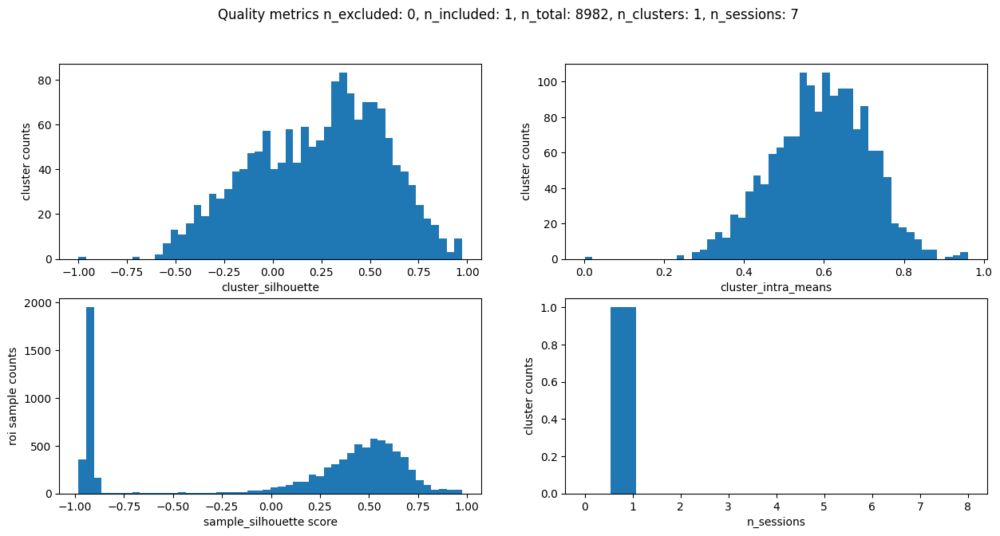

In [152]:
roicat.tracking.clustering.plot_quality_metrics(quality_metrics=quality_metrics, labels=labels_squeezed, n_sessions=data.n_sessions);

In [166]:
results_all['ROIs']['idx_roi_session']

array([0, 0, 0, ..., 6, 6, 6])

In [170]:
roi_sources = []
for sess_idx, n_roi in enumerate(data.n_roi):
    for roi_idx in range(n_roi):
        roi_sources.append((sess_idx, roi_idx))

In [174]:
roi_sources

[(0, 0),
 (0, 1),
 (0, 2),
 (0, 3),
 (0, 4),
 (0, 5),
 (0, 6),
 (0, 7),
 (0, 8),
 (0, 9),
 (0, 10),
 (0, 11),
 (0, 12),
 (0, 13),
 (0, 14),
 (0, 15),
 (0, 16),
 (0, 17),
 (0, 18),
 (0, 19),
 (0, 20),
 (0, 21),
 (0, 22),
 (0, 23),
 (0, 24),
 (0, 25),
 (0, 26),
 (0, 27),
 (0, 28),
 (0, 29),
 (0, 30),
 (0, 31),
 (0, 32),
 (0, 33),
 (0, 34),
 (0, 35),
 (0, 36),
 (0, 37),
 (0, 38),
 (0, 39),
 (0, 40),
 (0, 41),
 (0, 42),
 (0, 43),
 (0, 44),
 (0, 45),
 (0, 46),
 (0, 47),
 (0, 48),
 (0, 49),
 (0, 50),
 (0, 51),
 (0, 52),
 (0, 53),
 (0, 54),
 (0, 55),
 (0, 56),
 (0, 57),
 (0, 58),
 (0, 59),
 (0, 60),
 (0, 61),
 (0, 62),
 (0, 63),
 (0, 64),
 (0, 65),
 (0, 66),
 (0, 67),
 (0, 68),
 (0, 69),
 (0, 70),
 (0, 71),
 (0, 72),
 (0, 73),
 (0, 74),
 (0, 75),
 (0, 76),
 (0, 77),
 (0, 78),
 (0, 79),
 (0, 80),
 (0, 81),
 (0, 82),
 (0, 83),
 (0, 84),
 (0, 85),
 (0, 86),
 (0, 87),
 (0, 88),
 (0, 89),
 (0, 90),
 (0, 91),
 (0, 92),
 (0, 93),
 (0, 94),
 (0, 95),
 (0, 96),
 (0, 97),
 (0, 98),
 (0, 99),
 (0, 100),

In [172]:
# Step 2: Build dataframe from cluster labels
df = pd.DataFrame({
    'Neuron_ID': labels,
    'Session': [s for s, _ in roi_sources],
    'ROI_Index': [r for _, r in roi_sources]
})

# Step 3: Optionally remove unclustered ROIs
df = df[df['Neuron_ID'] != -1]

# Step 4: Pivot to wide format (neuron vs. session table)
neuron_table = df.pivot_table(index='Neuron_ID', columns='Session', values='ROI_Index', aggfunc='first')
neuron_table = neuron_table.fillna(-1).astype(int)

In [183]:
neuron_table.to_csv(os.path.join(dir_allOuterFolders, "all_neurons_all_sessions.csv"))

In [178]:
neurons_in_all_sessions = neuron_table[(neuron_table != -1).all(axis=1)]

In [181]:
neurons_in_all_sessions.to_csv(os.path.join(dir_allOuterFolders, "neurons_present_in_all_sessions.csv"))